# benchmark_procap

Focused PRO-cap benchmark notebook for positive/negative count scatter plots and profile summaries.


In [1]:
from __future__ import annotations

from pathlib import Path
import csv
import sys
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yaml
from scipy.spatial.distance import jensenshannon
from scipy.stats import spearmanr

warnings.filterwarnings("ignore", category=RuntimeWarning)


def find_repo_root(start: Path | None = None) -> Path:
    start = Path.cwd() if start is None else Path(start)
    for path in [start, *start.parents]:
        if (path / "examples" / "procap" / "file_config.py").exists():
            return path
    raise FileNotFoundError("Could not find repo root containing examples/procap/file_config.py")


REPO_ROOT = find_repo_root()
EXAMPLES_PROCAP_DIR = REPO_ROOT / "examples" / "procap"
for path in [REPO_ROOT, EXAMPLES_PROCAP_DIR]:
    if str(path) not in sys.path:
        sys.path.insert(0, str(path))

from data import extract_observed_profiles
from file_config import FoldFilesConfig
from performance_metrics import count_corr_mse_r2

pd.set_option("display.max_columns", None)

In [2]:
# -----------------------------
# User config
# -----------------------------
proj_dir = Path("/grid/koo/home/shared/capybara/procap")
cell_type = "K562"
data_type = "procap"
folds = [1, 2, 3, 4, 5, 6, 7]
rc_augmented = True
positive_split = "test"
negative_split = "dnase_test"

# One timestamp per model, reused across all folds.
# Update these timestamps to the runs you want to compare.
model_specs = [
    # {"label": "ProCapNet", "model_name": "procapnet", "timestamp": "260513_ft", "color": "#1565C0"},
    {"label": "CAPY (Y-net, MLP)", "model_name": "capy", "timestamp": "260513_ft", "color": "#D97706"},
    # {"label": "CAPY (U-net, MLP)", "model_name": "capy", "timestamp": "260517_unet_mlp", "color": "mediumvioletred"},
    # {"label": "CAPY (U-net, Linear)", "model_name": "capy", "timestamp": "260521_unet_linear", "color": "plum"},
    {"label": "CAPY (Y-net, Linear)", "model_name": "capy", "timestamp": "260522_ynet_linear", "color": "goldenrod"},
    {"label": "CAPY (Y-net, Encoder)", "model_name": "capy", "timestamp": "260522_ynet_encoder", "color": "brown"}
]

outdir = Path("./examples/procap/results/benchmark_260522_y_ablation")
outdir = outdir if outdir.is_absolute() else REPO_ROOT / outdir
outdir.mkdir(parents=True, exist_ok=True)

outdir


PosixPath('/grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation')

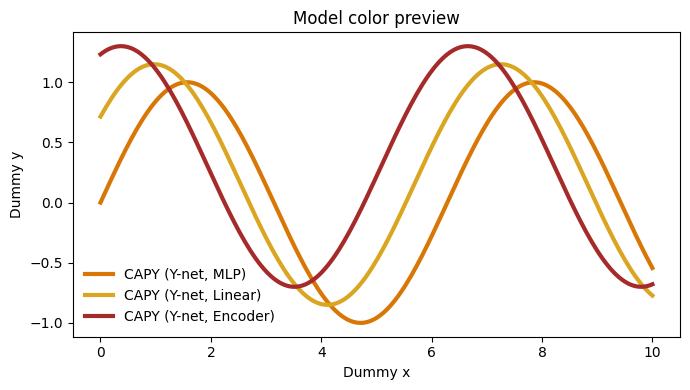

In [3]:
# Color sanity-check plot

x = np.linspace(0, 10, 200)
fig, ax = plt.subplots(figsize=(7, 4))

for i, spec in enumerate(model_specs):
    y = np.sin(x + i * 0.6) + i * 0.15

    ax.plot(
        x,
        y,
        label=spec["label"],
        color=spec["color"],
        linewidth=3,
    )

# Styling
ax.set_title("Model color preview")
ax.set_xlabel("Dummy x")
ax.set_ylabel("Dummy y")
ax.legend(frameon=False)

plt.tight_layout()
plt.show()

In [4]:
# -----------------------------
# General helpers
# -----------------------------
def read_yaml(path: Path) -> dict:
    with path.open("r") as handle:
        return yaml.safe_load(handle)


model_specs_df = pd.DataFrame(model_specs).copy()


def model_name_join(model_df: pd.DataFrame = model_specs_df) -> str:
    return "_".join(model_df["model_name"].tolist())


def get_fold_configs(model_name: str, timestamp: str) -> list[FoldFilesConfig]:
    return [
        FoldFilesConfig.create(
            proj_dir=proj_dir,
            cell_type=cell_type,
            data_type=data_type,
            fold=int(fold),
            model_name=model_name,
            timestamp=timestamp,
            use_unmappability_mask=False,
        )
        for fold in folds
    ]


def split_peak_path(cfg: FoldFilesConfig, split_name: str) -> Path:
    if split_name == "train":
        return cfg.train_peak_path
    if split_name == "val":
        return cfg.val_peak_path
    if split_name == "test":
        return cfg.test_peak_path
    if split_name == "dnase_train":
        return cfg.dnase_train_path
    if split_name == "dnase_val":
        return cfg.dnase_val_path
    if split_name == "dnase_test":
        return cfg.dnase_test_path
    raise ValueError(f"Unsupported split: {split_name}")


def count_paths(cfg: FoldFilesConfig, split_name: str) -> tuple[Path, Path]:
    rc_suffix = "_rc" if rc_augmented else ""
    base = Path(cfg.eval_dir)
    return (
        base / f"{cell_type}_log_true_counts{rc_suffix}_{split_name}.npy",
        base / f"{cell_type}_log_pred_counts{rc_suffix}_{split_name}.npy",
    )


def pred_profile_path(cfg: FoldFilesConfig, split_name: str) -> Path:
    rc_suffix = "_rc" if rc_augmented else ""
    return Path(cfg.eval_dir) / f"{cell_type}_log_pred_profiles{rc_suffix}_{split_name}.npy"


def load_count_pair(cfg: FoldFilesConfig, split_name: str) -> tuple[np.ndarray, np.ndarray]:
    true_path, pred_path = count_paths(cfg, split_name)
    missing = [str(path) for path in [true_path, pred_path] if not path.exists()]
    if missing:
        raise FileNotFoundError("Missing count prediction file(s):\n  " + "\n  ".join(missing))
    true_log = np.asarray(np.load(true_path), dtype=float).reshape(-1)
    pred_log = np.asarray(np.load(pred_path), dtype=float).reshape(-1)
    if true_log.shape != pred_log.shape:
        raise ValueError(
            f"Count shape mismatch for {cfg.model_name} fold {cfg.fold} {split_name}: "
            f"true={true_log.shape}, pred={pred_log.shape}"
        )
    return true_log, pred_log


def count_metrics(true_log: np.ndarray, pred_log: np.ndarray) -> dict[str, float]:
    true_log = np.asarray(true_log, dtype=float).reshape(-1)
    pred_log = np.asarray(pred_log, dtype=float).reshape(-1)
    finite = np.isfinite(true_log) & np.isfinite(pred_log)
    if not np.any(finite):
        raise ValueError("No finite count pairs available for metrics.")
    true_metric = true_log[finite].reshape(-1, 1, 1)
    pred_metric = pred_log[finite].reshape(-1, 1, 1)
    pearson, spearman, _mse, r2 = count_corr_mse_r2(true_metric, pred_metric)
    return {
        "pearson": float(pearson[0]),
        "spearman": float(spearman[0]),
        "r2": float(r2[0]),
        "n": int(finite.sum()),
    }


def raw_profile_metrics(reference_profiles: np.ndarray, query_profiles: np.ndarray) -> dict[str, np.ndarray]:
    # Matches benchmark_procap_260513.ipynb: no smoothing, flatten strands, scipy J-S distance base 2.
    if reference_profiles.shape != query_profiles.shape:
        raise ValueError(f"Profile shape mismatch: reference={reference_profiles.shape}, query={query_profiles.shape}")
    jsds, pears, spears = [], [], []
    for i, (reference_prof, query_prof) in enumerate(zip(reference_profiles, query_profiles)):
        reference_flat = np.asarray(reference_prof, dtype=np.float64).reshape(-1)
        query_flat = np.asarray(query_prof, dtype=np.float64).reshape(-1)
        if not np.isfinite(reference_flat).all() or not np.isfinite(query_flat).all():
            raise ValueError(f"Non-finite profile values at index {i}")
        if reference_flat.min() < -1e-6 or query_flat.min() < -1e-6:
            raise ValueError(f"Negative profile values at index {i}")
        reference_flat = np.clip(reference_flat, 0, None)
        query_flat = np.clip(query_flat, 0, None)
        jsds.append(np.nan if reference_flat.sum() == 0 or query_flat.sum() == 0 else jensenshannon(reference_flat, query_flat, base=2))
        pears.append(np.corrcoef(reference_flat, query_flat)[0, 1])
        spears.append(spearmanr(reference_flat, query_flat).correlation)
    return {
        "profile_jsd": np.asarray(jsds, dtype=float),
        "profile_pearson": np.asarray(pears, dtype=float),
        "profile_spearman": np.asarray(spears, dtype=float),
    }


def benchmark_profile_metrics(true_profiles: np.ndarray, pred_log_profiles: np.ndarray) -> dict[str, np.ndarray]:
    pred_profiles = np.exp(pred_log_profiles)
    return raw_profile_metrics(true_profiles, pred_profiles)


In [5]:
model_specs_df

,label,model_name,timestamp,color
0,"CAPY (Y-net, MLP)",capy,260513_ft,#D97706
1,"CAPY (Y-net, Linear)",capy,260522_ynet_linear,goldenrod
2,"CAPY (Y-net, Encoder)",capy,260522_ynet_encoder,brown


In [6]:
# -----------------------------
# Plot helpers
# -----------------------------
def reads_for_plot(true_log: np.ndarray, pred_log: np.ndarray, floor: float) -> tuple[np.ndarray, np.ndarray]:
    measured = np.expm1(np.asarray(true_log, dtype=float).reshape(-1))
    predicted = np.exp(np.asarray(pred_log, dtype=float).reshape(-1))
    measured = np.where(measured > 0, measured, floor)
    predicted = np.where(predicted > 0, predicted, floor)
    finite = np.isfinite(measured) & np.isfinite(predicted) & (measured > 0) & (predicted > 0)
    return measured[finite], predicted[finite]


def count_limits(pairs: list[tuple[np.ndarray, np.ndarray]], floor: float) -> tuple[float, float]:
    vals = []
    for true_log, pred_log in pairs:
        measured, predicted = reads_for_plot(true_log, pred_log, floor=floor)
        vals.extend([measured, predicted])
    all_values = np.concatenate([v for v in vals if len(v)])
    lo = max(float(np.nanmin(all_values)) * 0.8, floor)
    hi = float(np.nanmax(all_values)) * 1.2
    return lo, hi


def annotate_metrics(ax, metrics: dict[str, float], fontsize: float = 6.5) -> None:
    text = (
        f"Pearson $r$ = {metrics['pearson']:.3f}\n"
        f"Spearman $\\rho$ = {metrics['spearman']:.3f}\n"
        f"R2 = {metrics['r2']:.3f}\n"
        f"N = {metrics['n']:,}"
    )
    ax.text(0.05, 0.95, text, transform=ax.transAxes, va="top", ha="left", fontsize=fontsize, linespacing=1.12)


def style_count_ax(ax, lim: tuple[float, float], title: str, show_ylabel: bool) -> None:
    ax.plot(lim, lim, color="black", linewidth=0.6, linestyle="--", alpha=0.6)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlim(lim)
    ax.set_ylim(lim)
    ax.set_aspect("equal", adjustable="box")
    ax.set_title(title, fontsize=8)
    ax.set_xlabel("Measured Reads", fontsize=7)
    if show_ylabel:
        ax.set_ylabel("Predicted Reads", fontsize=7)
    ax.spines[["top", "right"]].set_visible(False)
    ax.tick_params(length=2, labelsize=6)


def draw_single_count_panel(
    ax,
    true_log: np.ndarray,
    pred_log: np.ndarray,
    color: str,
    lim: tuple[float, float],
    title: str,
    show_ylabel: bool,
    *,
    alpha: float,
    s: float,
    floor: float,
) -> None:
    measured, predicted = reads_for_plot(true_log, pred_log, floor=floor)
    ax.scatter(measured, predicted, alpha=alpha, s=s, color=color, linewidths=0)
    style_count_ax(ax, lim, title, show_ylabel)
    annotate_metrics(ax, count_metrics(true_log, pred_log))


def draw_combined_count_panel(
    ax,
    pos_true: np.ndarray,
    pos_pred: np.ndarray,
    neg_true: np.ndarray,
    neg_pred: np.ndarray,
    lim: tuple[float, float],
    title: str,
    show_ylabel: bool,
    *,
    pos_alpha_value: float,
    neg_alpha_value: float,
    s: float,
    floor: float,
    pos_color_value: str,
    neg_color_value: str,
) -> None:
    neg_measured, neg_predicted = reads_for_plot(neg_true, neg_pred, floor=floor)
    pos_measured, pos_predicted = reads_for_plot(pos_true, pos_pred, floor=floor)
    ax.scatter(neg_measured, neg_predicted, alpha=neg_alpha_value, s=s, color=neg_color_value, linewidths=0, label=f"Negative N={len(neg_true):,}")
    ax.scatter(pos_measured, pos_predicted, alpha=pos_alpha_value, s=s, color=pos_color_value, linewidths=0, label=f"Positive N={len(pos_true):,}")
    style_count_ax(ax, lim, title, show_ylabel)
    annotate_metrics(ax, count_metrics(np.r_[pos_true, neg_true], np.r_[pos_pred, neg_pred]))
    ax.legend(frameon=False, fontsize=5.5, loc="lower right", handlelength=1.0, borderaxespad=0.2)


def save_figure(fig, path: Path) -> None:
    path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(path, bbox_inches="tight", pad_inches=0.08)
    plt.show()
    print("saved:", path)


In [7]:
# -----------------------------
# Load observed positive profiles once, using the first model as the file reference
# -----------------------------
ref_cfgs = get_fold_configs(model_specs_df.iloc[0]["model_name"], model_specs_df.iloc[0]["timestamp"])
params = read_yaml(Path(ref_cfgs[0].params_path))
output_length = int(params["dataset"]["output_length"])

profile_truth_rows = []
true_profiles_all = []
fold_labels = []
for cfg in ref_cfgs:
    profiles = extract_observed_profiles(cfg.plus_bw_path, cfg.minus_bw_path, split_peak_path(cfg, positive_split), output_length)
    profile_truth_rows.append({"fold": int(cfg.fold), "true_profiles": profiles, "n": int(profiles.shape[0])})
    true_profiles_all.append(profiles)
    fold_labels.extend([int(cfg.fold)] * profiles.shape[0])

profile_truth_df = pd.DataFrame(profile_truth_rows)
true_profiles = np.concatenate(true_profiles_all, axis=0)
fold_labels = np.asarray(fold_labels, dtype=int)
print("true_profiles:", true_profiles.shape)
profile_truth_df[["fold", "n"]]


true_profiles: (30534, 2, 1000)


,fold,n
0,1,4334
1,2,3699
2,3,4559
3,4,3887
4,5,4470
5,6,5238
6,7,4347


In [8]:
# -----------------------------
# Load profile baselines for the cumulative test peak CDF
# -----------------------------
fold_ids = sorted(np.unique(fold_labels).astype(int))
avg_profiles_by_fold = {}
for fold in fold_ids:
    train_val_mask = fold_labels != fold
    if not np.any(train_val_mask):
        raise ValueError(f"Cannot build average profile baseline for fold {fold}: no other folds available")
    avg_profiles_by_fold[fold] = np.mean(true_profiles[train_val_mask], axis=0)
avg_profiles_over_folds = np.stack([avg_profiles_by_fold[int(fold)] for fold in fold_labels], axis=0)
avg_profile_metrics = raw_profile_metrics(true_profiles, avg_profiles_over_folds)

pseudorep1_profiles_all = []
pseudorep2_profiles_all = []
missing_pseudorep_paths = []
for cfg in ref_cfgs:
    peak_path = split_peak_path(cfg, positive_split)
    data_dir = Path(cfg.processed_dir)
    pseudorep_paths = [
        data_dir / "pseudorep1.pos.bigWig",
        data_dir / "pseudorep1.neg.bigWig",
        data_dir / "pseudorep2.pos.bigWig",
        data_dir / "pseudorep2.neg.bigWig",
    ]
    missing_for_fold = [path for path in pseudorep_paths if not path.exists()]
    if missing_for_fold:
        missing_pseudorep_paths.extend(missing_for_fold)
        continue
    pseudorep1_profiles_all.append(extract_observed_profiles(data_dir / "pseudorep1.pos.bigWig", data_dir / "pseudorep1.neg.bigWig", peak_path, output_length))
    pseudorep2_profiles_all.append(extract_observed_profiles(data_dir / "pseudorep2.pos.bigWig", data_dir / "pseudorep2.neg.bigWig", peak_path, output_length))

have_pseudoreps = not missing_pseudorep_paths
if have_pseudoreps:
    pseudorep1_profiles = np.concatenate(pseudorep1_profiles_all, axis=0)
    pseudorep2_profiles = np.concatenate(pseudorep2_profiles_all, axis=0)
    pseudorep_profile_metrics = raw_profile_metrics(pseudorep1_profiles, pseudorep2_profiles)
else:
    pseudorep_profile_metrics = None
    print("Pseudoreplicate BigWigs not found; pseudorep CDF baseline will be skipped.")
    print("Missing example:", missing_pseudorep_paths[0])

print("avg_profiles_over_folds:", avg_profiles_over_folds.shape)
print("have_pseudoreps:", have_pseudoreps)


avg_profiles_over_folds: (30534, 2, 1000)
have_pseudoreps: True


In [9]:
# -----------------------------
# Load all count/profile predictions into dataframes and compute profile metrics
# -----------------------------
count_rows = []
profile_pred_rows = []
profile_metric_rows = []

for _, spec in model_specs_df.iterrows():
    label = spec["label"]
    fold_cfgs = get_fold_configs(spec["model_name"], spec["timestamp"])
    model_params = read_yaml(Path(fold_cfgs[0].params_path))
    model_output_length = int(model_params["dataset"]["output_length"])
    if model_output_length != output_length:
        raise ValueError(f"{label} output_length={model_output_length}, expected {output_length}")

    pred_log_profiles_by_fold = []
    for cfg in fold_cfgs:
        fold = int(cfg.fold)
        true_profiles_fold = profile_truth_df.loc[profile_truth_df["fold"] == fold, "true_profiles"].iloc[0]
        for split_label, split_name in [("pos", positive_split), ("neg", negative_split)]:
            true_log, pred_log = load_count_pair(cfg, split_name)
            count_rows.append({
                "model": label,
                "model_name": spec["model_name"],
                "timestamp": spec["timestamp"],
                "color": spec["color"],
                "fold": fold,
                "split": split_label,
                "true_log": true_log,
                "pred_log": pred_log,
                "n": int(true_log.size),
            })

        prof_path = pred_profile_path(cfg, positive_split)
        if not prof_path.exists():
            raise FileNotFoundError(f"Missing profile prediction file: {prof_path}")
        pred_log_profiles_fold = np.asarray(np.load(prof_path), dtype=float)
        if pred_log_profiles_fold.shape != true_profiles_fold.shape:
            raise ValueError(
                f"Profile shape mismatch for {label} fold {fold}: "
                f"pred={pred_log_profiles_fold.shape}, true={true_profiles_fold.shape}"
            )
        profile_pred_rows.append({
            "model": label,
            "model_name": spec["model_name"],
            "timestamp": spec["timestamp"],
            "color": spec["color"],
            "fold": fold,
            "pred_log_profiles": pred_log_profiles_fold,
            "n": int(pred_log_profiles_fold.shape[0]),
        })
        pred_log_profiles_by_fold.append(pred_log_profiles_fold)

    pred_log_profiles = np.concatenate(pred_log_profiles_by_fold, axis=0)
    metrics = benchmark_profile_metrics(true_profiles, pred_log_profiles)
    for metric_name, values in metrics.items():
        for fold in folds:
            mask = fold_labels == fold
            profile_metric_rows.append({
                "model": label,
                "model_name": spec["model_name"],
                "timestamp": spec["timestamp"],
                "color": spec["color"],
                "fold": int(fold),
                "metric": metric_name,
                "values": values[mask],
                "mean": float(np.nanmean(values[mask])),
                "n": int(mask.sum()),
            })

count_df = pd.DataFrame(count_rows)
profile_pred_df = pd.DataFrame(profile_pred_rows)
profile_metric_df = pd.DataFrame(profile_metric_rows)
print("count_df rows:", len(count_df), "profile_pred_df rows:", len(profile_pred_df), "profile_metric_df rows:", len(profile_metric_df))
count_df[["model", "fold", "split", "n"]].head()


count_df rows: 42 profile_pred_df rows: 21 profile_metric_df rows: 63


,model,fold,split,n
0,"CAPY (Y-net, MLP)",1,pos,4334
1,"CAPY (Y-net, MLP)",1,neg,11881
2,"CAPY (Y-net, MLP)",2,pos,3699
3,"CAPY (Y-net, MLP)",2,neg,10778
4,"CAPY (Y-net, MLP)",3,pos,4559


In [10]:
# -----------------------------
# Dataframe accessors
# -----------------------------
def count_row(model: str, fold: int, split: str) -> pd.Series:
    rows = count_df[(count_df["model"] == model) & (count_df["fold"] == int(fold)) & (count_df["split"] == split)]
    if len(rows) != 1:
        raise ValueError(f"Expected one count row for model={model}, fold={fold}, split={split}; got {len(rows)}")
    return rows.iloc[0]


def aggregate_count_arrays(model: str, split: str) -> tuple[np.ndarray, np.ndarray]:
    if split in {"pos", "neg"}:
        rows = count_df[(count_df["model"] == model) & (count_df["split"] == split)].sort_values("fold")
        return np.concatenate(rows["true_log"].to_list()), np.concatenate(rows["pred_log"].to_list())
    if split == "pos_neg":
        pos_true, pos_pred = aggregate_count_arrays(model, "pos")
        neg_true, neg_pred = aggregate_count_arrays(model, "neg")
        return np.r_[pos_true, neg_true], np.r_[pos_pred, neg_pred]
    raise ValueError(f"Unsupported aggregate split: {split}")


def model_color(model: str) -> str:
    return model_specs_df.loc[model_specs_df["label"] == model, "color"].iloc[0]


In [11]:
# -----------------------------
# Numerical results CSVs
# -----------------------------
def write_csv(path: Path, rows: list[dict]) -> None:
    path.parent.mkdir(parents=True, exist_ok=True)
    fieldnames = sorted({key for row in rows for key in row.keys()})
    with path.open("w", newline="") as handle:
        writer = csv.DictWriter(handle, fieldnames=fieldnames)
        writer.writeheader()
        writer.writerows(rows)
    print("saved:", path)


def fold_mean_std(values: list[float]) -> tuple[float, float]:
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return float("nan"), float("nan")
    if values.size == 1:
        return float(values[0]), float("nan")
    return float(np.mean(values)), float(np.std(values, ddof=1))


count_fold_rows = []
count_aggregate_rows = []
profile_fold_rows = []
profile_aggregate_rows = []

for _, spec in model_specs_df.iterrows():
    label = spec["label"]
    for fold in folds:
        pos = count_row(label, fold, "pos")
        neg = count_row(label, fold, "neg")
        split_arrays = {
            "pos": (pos["true_log"], pos["pred_log"]),
            "neg": (neg["true_log"], neg["pred_log"]),
            "pos_neg": (np.r_[pos["true_log"], neg["true_log"]], np.r_[pos["pred_log"], neg["pred_log"]]),
        }
        for split_label, (true_log, pred_log) in split_arrays.items():
            metrics = count_metrics(true_log, pred_log)
            count_fold_rows.append({
                "model": label,
                "model_name": spec["model_name"],
                "timestamp": spec["timestamp"],
                "fold": int(fold),
                "split": split_label,
                "pearson": metrics["pearson"],
                "spearman": metrics["spearman"],
                "r2": metrics["r2"],
                "n": metrics["n"],
            })

    for split_label in ["pos", "neg", "pos_neg"]:
        true_log, pred_log = aggregate_count_arrays(label, split_label)
        metrics = count_metrics(true_log, pred_log)
        fold_rows = [
            row
            for row in count_fold_rows
            if row["model"] == label and row["split"] == split_label
        ]
        pearson_mean, pearson_std = fold_mean_std([row["pearson"] for row in fold_rows])
        spearman_mean, spearman_std = fold_mean_std([row["spearman"] for row in fold_rows])
        r2_mean, r2_std = fold_mean_std([row["r2"] for row in fold_rows])
        count_aggregate_rows.append({
            "model": label,
            "model_name": spec["model_name"],
            "timestamp": spec["timestamp"],
            "split": split_label,
            "pearson": metrics["pearson"],
            "spearman": metrics["spearman"],
            "r2": metrics["r2"],
            "pearson_fold_mean": pearson_mean,
            "pearson_fold_std": pearson_std,
            "spearman_fold_mean": spearman_mean,
            "spearman_fold_std": spearman_std,
            "r2_fold_mean": r2_mean,
            "r2_fold_std": r2_std,
            "n": metrics["n"],
        })

    for fold in folds:
        sub = profile_metric_df[(profile_metric_df["model"] == label) & (profile_metric_df["fold"] == fold)]
        profile_fold_rows.append({
            "model": label,
            "model_name": spec["model_name"],
            "timestamp": spec["timestamp"],
            "fold": int(fold),
            "profile_jsd_mean": float(sub.loc[sub["metric"] == "profile_jsd", "mean"].iloc[0]),
            "profile_pearson_mean": float(sub.loc[sub["metric"] == "profile_pearson", "mean"].iloc[0]),
            "profile_spearman_mean": float(sub.loc[sub["metric"] == "profile_spearman", "mean"].iloc[0]),
            "n": int(sub["n"].iloc[0]),
        })
    model_profile = profile_metric_df[profile_metric_df["model"] == label]
    profile_fold_model_rows = [row for row in profile_fold_rows if row["model"] == label]
    profile_jsd_fold_mean, profile_jsd_fold_std = fold_mean_std([
        row["profile_jsd_mean"] for row in profile_fold_model_rows
    ])
    profile_pearson_fold_mean, profile_pearson_fold_std = fold_mean_std([
        row["profile_pearson_mean"] for row in profile_fold_model_rows
    ])
    profile_spearman_fold_mean, profile_spearman_fold_std = fold_mean_std([
        row["profile_spearman_mean"] for row in profile_fold_model_rows
    ])
    profile_aggregate_rows.append({
        "model": label,
        "model_name": spec["model_name"],
        "timestamp": spec["timestamp"],
        "profile_jsd_mean": float(np.nanmean(np.concatenate(model_profile.loc[model_profile["metric"] == "profile_jsd", "values"].to_list()))),
        "profile_pearson_mean": float(np.nanmean(np.concatenate(model_profile.loc[model_profile["metric"] == "profile_pearson", "values"].to_list()))),
        "profile_spearman_mean": float(np.nanmean(np.concatenate(model_profile.loc[model_profile["metric"] == "profile_spearman", "values"].to_list()))),
        "profile_jsd_fold_mean": profile_jsd_fold_mean,
        "profile_jsd_fold_std": profile_jsd_fold_std,
        "profile_pearson_fold_mean": profile_pearson_fold_mean,
        "profile_pearson_fold_std": profile_pearson_fold_std,
        "profile_spearman_fold_mean": profile_spearman_fold_mean,
        "profile_spearman_fold_std": profile_spearman_fold_std,
        "n": int(sum(model_profile.loc[model_profile["metric"] == "profile_jsd", "n"])),
    })

write_csv(outdir / "count_metrics_by_fold.csv", count_fold_rows)
write_csv(outdir / "count_metrics_aggregate.csv", count_aggregate_rows)
write_csv(outdir / "profile_metrics_by_fold.csv", profile_fold_rows)
write_csv(outdir / "profile_metrics_aggregate.csv", profile_aggregate_rows)


saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_metrics_by_fold.csv
saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_metrics_aggregate.csv
saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/profile_metrics_by_fold.csv
saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/profile_metrics_aggregate.csv


In [12]:
count_metrics_df = pd.DataFrame(count_fold_rows)
for split in ["pos", "neg", "pos_neg"]:
    print(f"=== Split: {split} ===")
    for model_name in count_metrics_df["model_name"].unique():
        model_df = count_metrics_df[(count_metrics_df["model_name"] == model_name) & (count_metrics_df["split"] == split)]
        for metrics_name in ["pearson", "spearman", "r2"]:
            # print average + std across folds
            mean = model_df[metrics_name].mean()
            std = model_df[metrics_name].std()
            print(f"{model_name} {metrics_name}: {mean:.4f} ± {std:.4f}")

=== Split: pos ===
capy pearson: 0.7304 ± 0.0240
capy spearman: 0.7557 ± 0.0218
capy r2: 0.3249 ± 0.0617
=== Split: neg ===
capy pearson: 0.4952 ± 0.0175
capy spearman: 0.4868 ± 0.0184
capy r2: -0.9266 ± 0.1879
=== Split: pos_neg ===
capy pearson: 0.7517 ± 0.0130
capy spearman: 0.7225 ± 0.0171
capy r2: 0.4299 ± 0.0511


In [13]:
profile_fold_summary_df = pd.DataFrame(profile_fold_rows)
for model_name in profile_fold_summary_df["model_name"].unique():
    model_df = profile_fold_summary_df[(profile_fold_summary_df["model_name"] == model_name)]
    for metrics_name in ["profile_jsd_mean", "profile_pearson_mean", "profile_spearman_mean"]:
        # print average + std across folds
        mean = model_df[metrics_name].mean()
        std = model_df[metrics_name].std()
        print(f"{model_name} {metrics_name}: {mean:.4f} ± {std:.4f}")

capy profile_jsd_mean: 0.6533 ± 0.0049
capy profile_pearson_mean: 0.5946 ± 0.0073
capy profile_spearman_mean: 0.3035 ± 0.0043


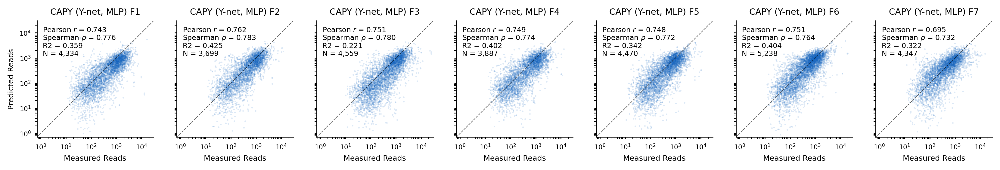

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_pos_capy.pdf


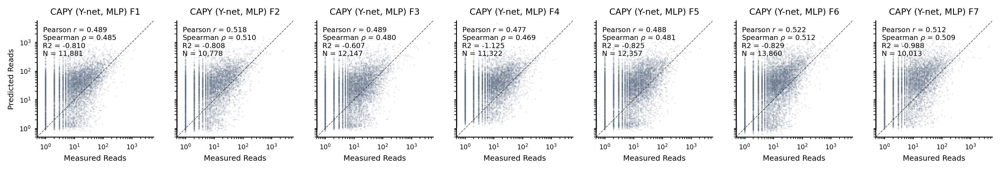

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_neg_capy.pdf


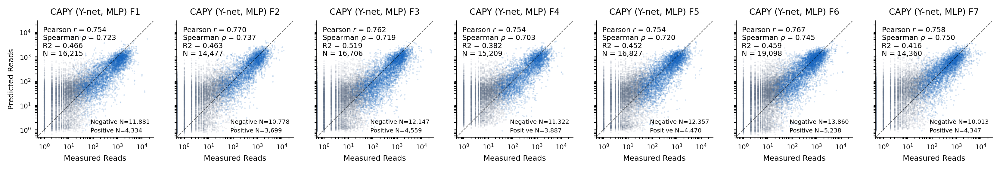

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_pos_neg_capy.pdf


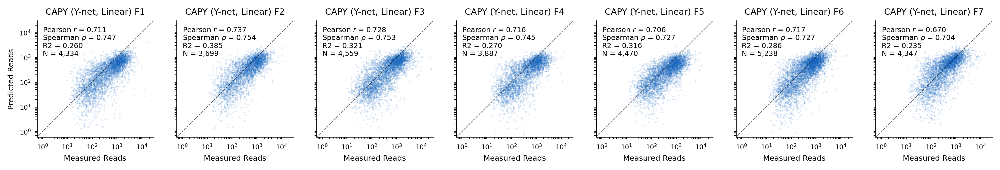

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_pos_capy.pdf


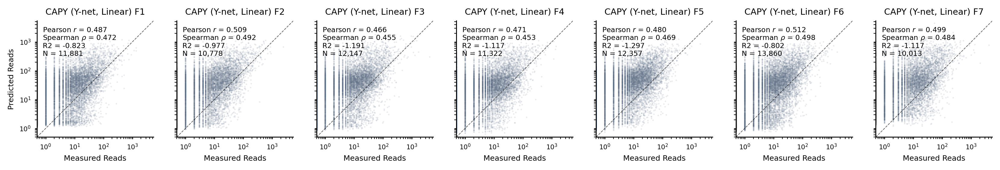

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_neg_capy.pdf


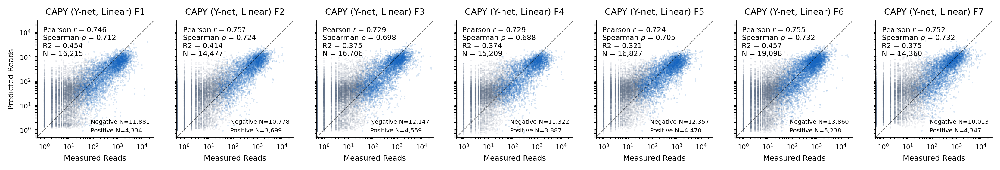

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_pos_neg_capy.pdf


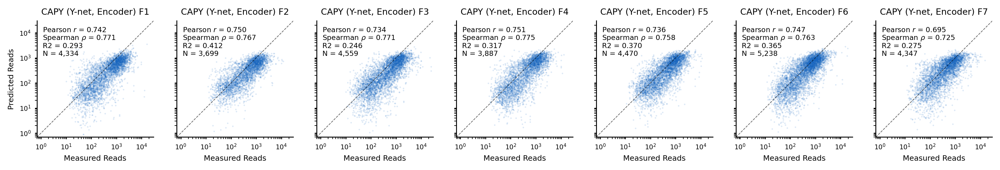

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_pos_capy.pdf


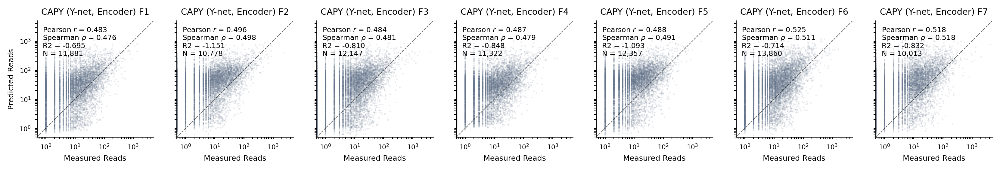

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_neg_capy.pdf


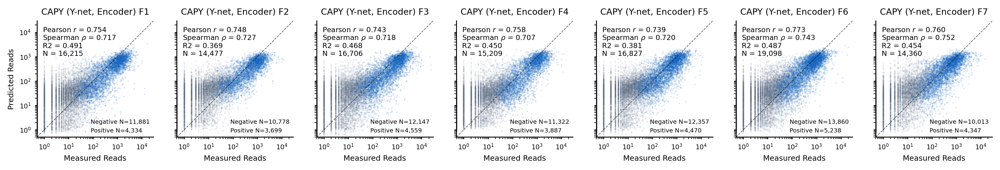

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_folds_pos_neg_capy.pdf


In [14]:
# -----------------------------
# Per-fold count scatter plots: one row, seven columns, one PDF per model/type
# -----------------------------
# Local plot controls for this block.
fold_plot_floor = 0.5
fold_point_size = 2
fold_pos_alpha = 0.16
fold_neg_alpha = 0.10
fold_single_alpha = 0.14
fold_panel_size = 2.25
fold_dpi = 260
fold_pos_color = "#1565C0"
fold_neg_color = "#64748B"

for _, spec in model_specs_df.iterrows():
    label = spec["label"]
    model_name = spec["model_name"]
    fold_pairs = [(count_row(label, f, "pos")["true_log"], count_row(label, f, "pos")["pred_log"]) for f in folds]
    lim = count_limits(fold_pairs, floor=fold_plot_floor)
    fig, axes = plt.subplots(1, len(folds), figsize=(fold_panel_size * len(folds), fold_panel_size), dpi=fold_dpi, sharex=True, sharey=True)
    for i, (ax, fold) in enumerate(zip(np.atleast_1d(axes), folds)):
        row = count_row(label, fold, "pos")
        draw_single_count_panel(ax, row["true_log"], row["pred_log"], fold_pos_color, lim, f"{label} F{fold}", i == 0, alpha=fold_single_alpha, s=fold_point_size, floor=fold_plot_floor)
    save_figure(fig, outdir / f"count_scatter_folds_pos_{model_name}.pdf")

    fold_pairs = [(count_row(label, f, "neg")["true_log"], count_row(label, f, "neg")["pred_log"]) for f in folds]
    lim = count_limits(fold_pairs, floor=fold_plot_floor)
    fig, axes = plt.subplots(1, len(folds), figsize=(fold_panel_size * len(folds), fold_panel_size), dpi=fold_dpi, sharex=True, sharey=True)
    for i, (ax, fold) in enumerate(zip(np.atleast_1d(axes), folds)):
        row = count_row(label, fold, "neg")
        draw_single_count_panel(ax, row["true_log"], row["pred_log"], fold_neg_color, lim, f"{label} F{fold}", i == 0, alpha=fold_single_alpha, s=fold_point_size, floor=fold_plot_floor)
    save_figure(fig, outdir / f"count_scatter_folds_neg_{model_name}.pdf")

    fold_pairs = []
    for fold in folds:
        pos = count_row(label, fold, "pos")
        neg = count_row(label, fold, "neg")
        fold_pairs.extend([(pos["true_log"], pos["pred_log"]), (neg["true_log"], neg["pred_log"])])
    lim = count_limits(fold_pairs, floor=fold_plot_floor)
    fig, axes = plt.subplots(1, len(folds), figsize=(fold_panel_size * len(folds), fold_panel_size), dpi=fold_dpi, sharex=True, sharey=True)
    for i, (ax, fold) in enumerate(zip(np.atleast_1d(axes), folds)):
        pos = count_row(label, fold, "pos")
        neg = count_row(label, fold, "neg")
        draw_combined_count_panel(
            ax,
            pos["true_log"],
            pos["pred_log"],
            neg["true_log"],
            neg["pred_log"],
            lim,
            f"{label} F{fold}",
            i == 0,
            pos_alpha_value=fold_pos_alpha,
            neg_alpha_value=fold_neg_alpha,
            s=fold_point_size,
            floor=fold_plot_floor,
            pos_color_value=fold_pos_color,
            neg_color_value=fold_neg_color,
        )
    save_figure(fig, outdir / f"count_scatter_folds_pos_neg_{model_name}.pdf")


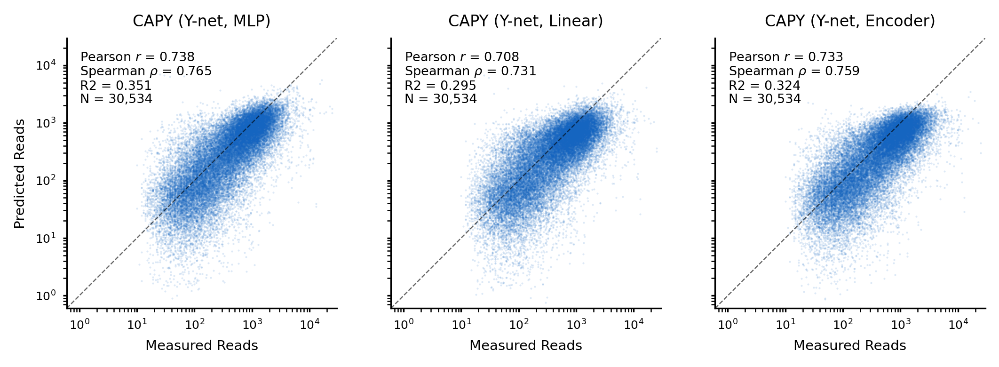

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_pos_capy_capy_capy.pdf


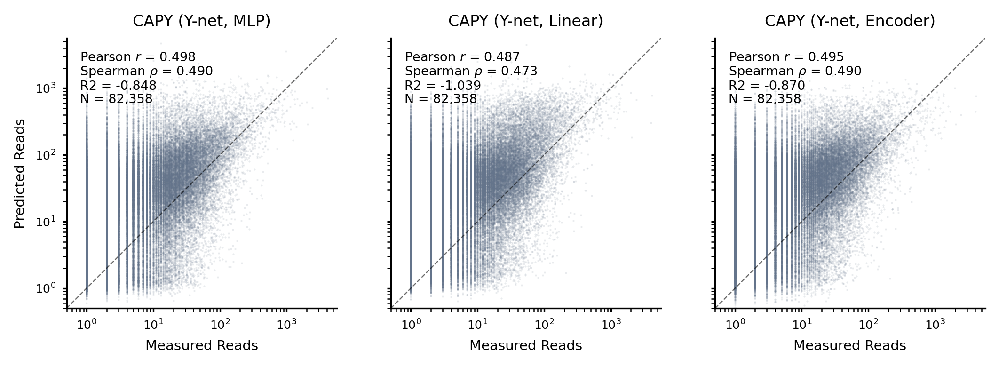

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_neg_capy_capy_capy.pdf


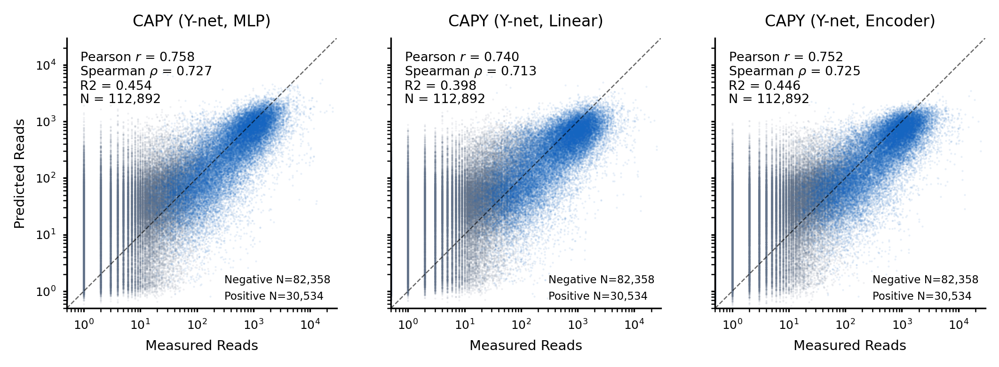

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/count_scatter_pos_neg_capy_capy_capy.pdf


In [15]:
# -----------------------------
# Aggregated count scatter plots: one row, one column per model
# -----------------------------
# Local plot controls for this block.
agg_plot_floor = 0.5
agg_point_size = 1
agg_pos_alpha = 0.1
agg_neg_alpha = 0.10
agg_single_alpha = 0.14
agg_panel_size = 2.8
agg_dpi = 300
agg_pos_color = "#1565C0"
agg_neg_color = "#64748B"

joined = model_name_join()

lim = count_limits([aggregate_count_arrays(label, "pos") for label in model_specs_df["label"]], floor=agg_plot_floor)
fig, axes = plt.subplots(1, len(model_specs_df), figsize=(agg_panel_size * len(model_specs_df), agg_panel_size), dpi=agg_dpi, sharex=True, sharey=True)
for i, (ax, (_, spec)) in enumerate(zip(np.atleast_1d(axes), model_specs_df.iterrows())):
    true_log, pred_log = aggregate_count_arrays(spec["label"], "pos")
    draw_single_count_panel(ax, true_log, pred_log, agg_pos_color, lim, spec["label"], i == 0, alpha=agg_single_alpha, s=agg_point_size, floor=agg_plot_floor)
save_figure(fig, outdir / f"count_scatter_pos_{joined}.pdf")

lim = count_limits([aggregate_count_arrays(label, "neg") for label in model_specs_df["label"]], floor=agg_plot_floor)
fig, axes = plt.subplots(1, len(model_specs_df), figsize=(agg_panel_size * len(model_specs_df), agg_panel_size), dpi=agg_dpi, sharex=True, sharey=True)
for i, (ax, (_, spec)) in enumerate(zip(np.atleast_1d(axes), model_specs_df.iterrows())):
    true_log, pred_log = aggregate_count_arrays(spec["label"], "neg")
    draw_single_count_panel(ax, true_log, pred_log, agg_neg_color, lim, spec["label"], i == 0, alpha=agg_single_alpha, s=agg_point_size, floor=agg_plot_floor)
save_figure(fig, outdir / f"count_scatter_neg_{joined}.pdf")

lim = count_limits([aggregate_count_arrays(label, "pos") for label in model_specs_df["label"]] + [aggregate_count_arrays(label, "neg") for label in model_specs_df["label"]], floor=agg_plot_floor)
fig, axes = plt.subplots(1, len(model_specs_df), figsize=(agg_panel_size * len(model_specs_df), agg_panel_size), dpi=agg_dpi, sharex=True, sharey=True)
for i, (ax, (_, spec)) in enumerate(zip(np.atleast_1d(axes), model_specs_df.iterrows())):
    pos_true, pos_pred = aggregate_count_arrays(spec["label"], "pos")
    neg_true, neg_pred = aggregate_count_arrays(spec["label"], "neg")
    draw_combined_count_panel(
        ax,
        pos_true,
        pos_pred,
        neg_true,
        neg_pred,
        lim,
        spec["label"],
        i == 0,
        pos_alpha_value=agg_pos_alpha,
        neg_alpha_value=agg_neg_alpha,
        s=agg_point_size,
        floor=agg_plot_floor,
        pos_color_value=agg_pos_color,
        neg_color_value=agg_neg_color,
    )
save_figure(fig, outdir / f"count_scatter_pos_neg_{joined}.pdf")


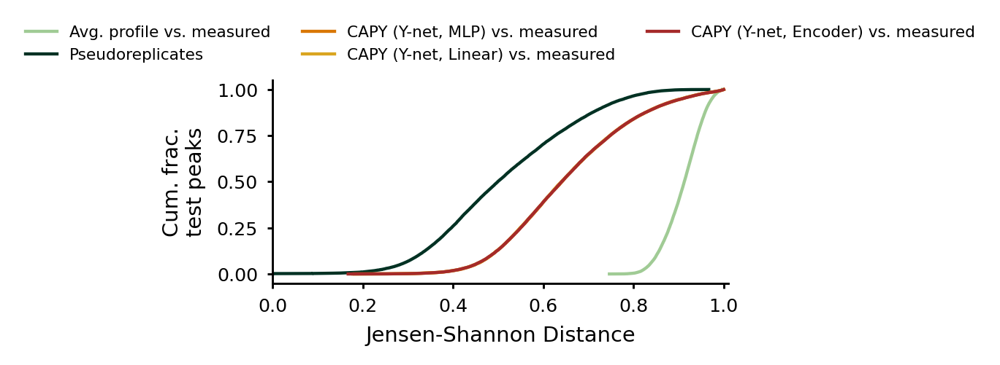

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/cmp_cdf_profile_jsd.pdf


In [16]:
# -----------------------------
# Profile cumulative test peak CDF
# -----------------------------
# Local plot controls for this block.
profile_cdf_figsize = (3.0, 2.1)
profile_cdf_dpi = 260
profile_cdf_linewidth = 1.2
profile_cdf_legend_fontsize = 6
profile_cdf_axis_fontsize = 8
profile_cdf_tick_fontsize = 7

fig, ax = plt.subplots(figsize=profile_cdf_figsize, dpi=profile_cdf_dpi)

avg_values = np.asarray(avg_profile_metrics["profile_jsd"], dtype=float)
avg_values = np.sort(avg_values[np.isfinite(avg_values)])
ax.plot(avg_values, np.arange(1, len(avg_values) + 1) / len(avg_values), color="#A0CB95", linewidth=profile_cdf_linewidth, label="Avg. profile vs. measured")

if pseudorep_profile_metrics is not None:
    pseudorep_values = np.asarray(pseudorep_profile_metrics["profile_jsd"], dtype=float)
    pseudorep_values = np.sort(pseudorep_values[np.isfinite(pseudorep_values)])
    ax.plot(pseudorep_values, np.arange(1, len(pseudorep_values) + 1) / len(pseudorep_values), color="#003123", linewidth=profile_cdf_linewidth, label="Pseudoreplicates")

for _, spec in model_specs_df.iterrows():
    pred_log_profiles = np.concatenate(
        profile_pred_df.loc[profile_pred_df["model"] == spec["label"]].sort_values("fold")["pred_log_profiles"].to_list(),
        axis=0,
    )
    values = benchmark_profile_metrics(true_profiles, pred_log_profiles)["profile_jsd"]
    values = np.sort(values[np.isfinite(values)])
    ax.plot(values, np.arange(1, len(values) + 1) / len(values), color=spec["color"], linewidth=profile_cdf_linewidth, label=f"{spec['label']} vs. measured")
ax.set_xlabel("Jensen-Shannon Distance", fontsize=profile_cdf_axis_fontsize)
ax.set_ylabel("Cum. frac.\ntest peaks", fontsize=profile_cdf_axis_fontsize)
ax.set_xlim(0, 1.01)
ax.spines[["top", "right"]].set_visible(False)
ax.tick_params(length=2, labelsize=profile_cdf_tick_fontsize)
ax.legend(frameon=False, fontsize=profile_cdf_legend_fontsize, loc="lower center", bbox_to_anchor=(0.5, 1.02), ncol=max(1, len(model_specs_df)))
fig.subplots_adjust(left=0.18, right=0.98, bottom=0.23, top=0.74)
save_figure(fig, outdir / "cmp_cdf_profile_jsd.pdf")


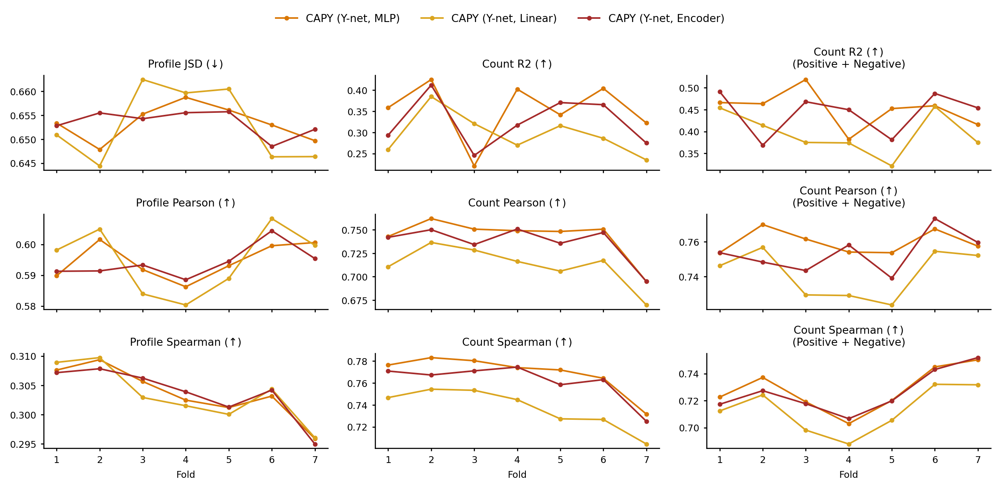

saved: /grid/koo/home/nagai/projects/capybara/examples/procap/results/benchmark_260522_y_ablation/cmp_fold_metrics.pdf


In [17]:
# -----------------------------
# Fold-level profile/count summaries
# -----------------------------
# Local plot controls for this block.
fold_metric_figsize = (10.5, 5.0)
fold_metric_dpi = 240
fold_metric_linewidth = 1.2
fold_metric_marker_size = 2.5
fold_metric_title_fontsize = 8
fold_metric_axis_fontsize = 7
fold_metric_tick_fontsize = 7
fold_metric_legend_fontsize = 8

metric_grid = [
    ("profile_jsd", "count_pos_r2", "count_pos_neg_r2"),
    ("profile_pearson", "count_pos_pearson", "count_pos_neg_pearson"),
    ("profile_spearman", "count_pos_spearman", "count_pos_neg_spearman"),
]
metric_titles = {
    "profile_jsd": "Profile JSD (↓)",
    "profile_pearson": "Profile Pearson (↑)",
    "profile_spearman": "Profile Spearman (↑)",
    "count_pos_r2": "Count R2 (↑)",
    "count_pos_pearson": "Count Pearson (↑)",
    "count_pos_spearman": "Count Spearman (↑)",
    "count_pos_neg_r2": "Count R2 (↑)\n(Positive + Negative)",
    "count_pos_neg_pearson": "Count Pearson (↑)\n(Positive + Negative)",
    "count_pos_neg_spearman": "Count Spearman (↑)\n(Positive + Negative)",
}

fold_values: dict[tuple[str, str], list[tuple[int, float]]] = {}
for _, spec in model_specs_df.iterrows():
    label = spec["label"]
    model_profile_rows = profile_pred_df[profile_pred_df["model"] == label].sort_values("fold")
    model_profile_metrics = {"profile_jsd": [], "profile_pearson": [], "profile_spearman": []}
    for _, profile_row in model_profile_rows.iterrows():
        fold = int(profile_row["fold"])
        true_profiles_fold = profile_truth_df.loc[profile_truth_df["fold"] == fold, "true_profiles"].iloc[0]
        metrics = benchmark_profile_metrics(true_profiles_fold, profile_row["pred_log_profiles"])
        for metric_name, values in metrics.items():
            model_profile_metrics[metric_name].append((fold, float(np.nanmean(values))))
    for metric_name, values in model_profile_metrics.items():
        fold_values[(label, metric_name)] = values
    for metric_name, source in [
        ("count_pos_r2", "r2"),
        ("count_pos_pearson", "pearson"),
        ("count_pos_spearman", "spearman"),
        ("count_pos_neg_r2", "r2"),
        ("count_pos_neg_pearson", "pearson"),
        ("count_pos_neg_spearman", "spearman"),
    ]:
        fold_values[(label, metric_name)] = []
        for fold in folds:
            pos = count_row(label, fold, "pos")
            if metric_name.startswith("count_pos_neg"):
                neg = count_row(label, fold, "neg")
                true_log = np.r_[pos["true_log"], neg["true_log"]]
                pred_log = np.r_[pos["pred_log"], neg["pred_log"]]
            else:
                true_log = pos["true_log"]
                pred_log = pos["pred_log"]
            m = count_metrics(true_log, pred_log)
            fold_values[(label, metric_name)].append((fold, float(m[source])))

fig, axes = plt.subplots(len(metric_grid), len(metric_grid[0]), figsize=fold_metric_figsize, dpi=fold_metric_dpi, sharex=True)
for row, metric_row in enumerate(metric_grid):
    for col, metric in enumerate(metric_row):
        ax = axes[row, col]
        for _, spec in model_specs_df.iterrows():
            vals = fold_values[(spec["label"], metric)]
            xs = [x for x, _ in vals]
            ys = [y for _, y in vals]
            ax.plot(xs, ys, marker="o", linewidth=fold_metric_linewidth, markersize=fold_metric_marker_size, color=spec["color"], label=spec["label"])
        ax.set_title(metric_titles[metric], fontsize=fold_metric_title_fontsize)
        if row == len(metric_grid) - 1:
            ax.set_xlabel("Fold", fontsize=fold_metric_axis_fontsize)
        ax.set_xticks(folds)
        ax.spines[["top", "right"]].set_visible(False)
        ax.tick_params(length=2, labelsize=fold_metric_tick_fontsize)
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, frameon=False, fontsize=fold_metric_legend_fontsize, ncol=len(labels), loc="upper center", bbox_to_anchor=(0.5, 1.02))
fig.tight_layout(rect=(0, 0, 1, 0.96), w_pad=1.0, h_pad=1.0)
save_figure(fig, outdir / "cmp_fold_metrics.pdf")
